In [ ]:
from sklearn.datasets import make_classification

import numpy as np
X,y = make_classification(n_samples=100,n_features=2,n_informative=1,n_redundant=0,
                          n_classes=2,  n_clusters_per_class=1,random_state=41,hypercube=False,class_sep=10)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline


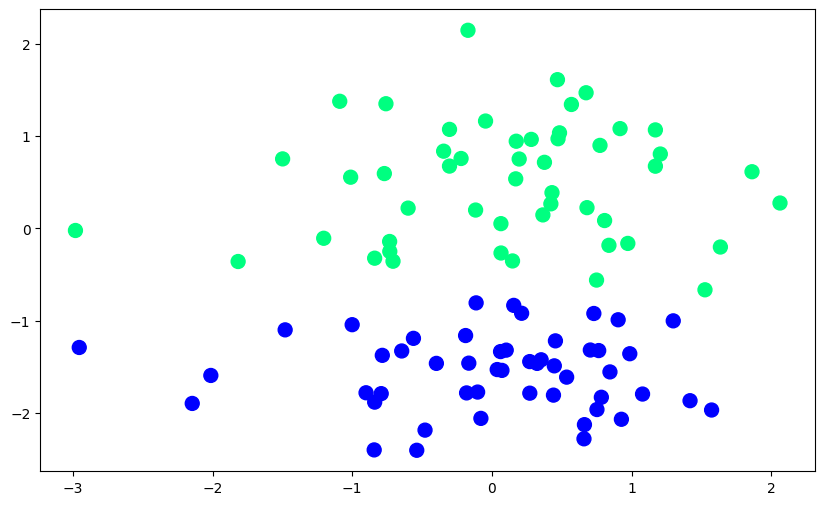

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,1],X[:,0],c=y,cmap='winter',s=100)


In [ ]:
X

array([[ 0.19924745, -0.11697552],
       [-0.24882029, -0.73115232],
       [-0.3544904 , -0.7081059 ],
       [-1.59086506, -2.01199214],
       [-0.20083951,  1.63493163],
       [-0.83241122,  0.15599044],
       [-1.79207014,  1.07782053],
       [ 0.0856607 ,  0.80626713],
       [-0.55865299,  0.74859527],
       [-1.95974262,  0.75152794],
       [-1.77828947, -0.90114581],
       [-1.77985853, -0.1815243 ],
       [-0.02194151, -2.98092432],
       [ 0.80563431,  1.20500136],
       [-1.82701214,  0.78302407],
       [ 0.38730728,  0.42968688],
       [-0.14108668, -0.73229726],
       [-1.87955941, -0.83930476],
       [-0.18232911,  0.83727062],
       [-1.77059533, -0.10255323],
       [-2.27658028,  0.65867001],
       [-2.06519502,  0.92649819],
       [-1.31690551,  0.10216193],
       [ 1.61043259,  0.46886454],
       [-1.21650394,  0.45432938],
       [ 0.6139723 ,  1.8613386 ],
       [-1.78760957, -0.79255991],
       [-1.04149161, -1.0004391 ],
       [-2.40067584,

In [ ]:
y

array([1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1])

In [ ]:
def perceptron(X,y):
  X = np.insert(X,0,1,axis=1)
  weights = np.ones(X.shape[1])
  lr = 0.1

  for i in range(1000):
    j = np.random.randint(0,100)
    y_hat = step(np.dot(X[j],weights))
    weights = weights + lr*(y[j]-y_hat)*X[j]

  return weights[0],weights[1:]

In [ ]:
def step(z):
  return 1 if z>0 else 0

In [ ]:
intercept_,coeff_ = perceptron(X,y)

In [ ]:
print(coeff_)
print(intercept_)

[1.3925684  0.15716083]
0.9


In [ ]:
m = -(coeff_[0]/coeff_[1])
b = -(intercept_/coeff_[1])

In [ ]:
X_input = np.linspace(-3,3,100)
y_input = m*X_input + b

(-3.0, 2.0)

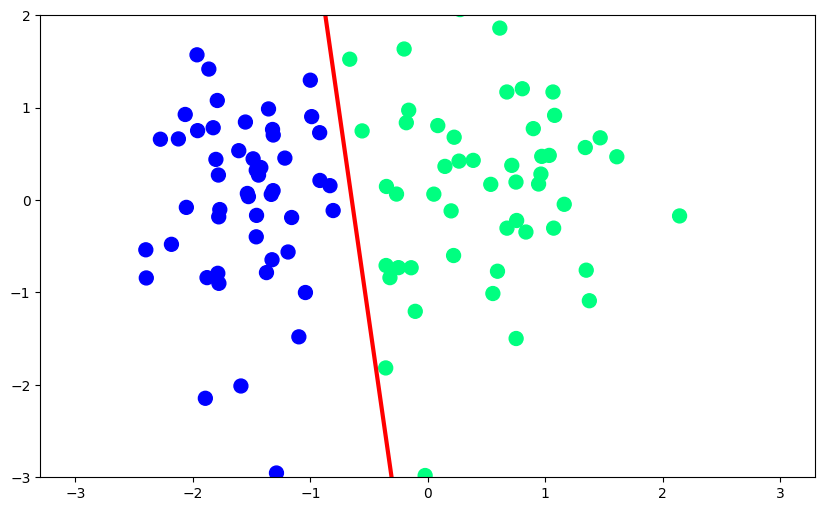

In [ ]:
plt.figure(figsize = (10,6))
plt.plot(X_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [ ]:
def perceptron(X,y):

  m = []
  b = []

  X = np.insert(X,0,1,axis=1)
  weights = np.ones (X.shape[1])
  lr=0.1

  for i in range (200):
    j = np.random.randint(0,100)
    y_hat  = step(np.dot(X[j],weights)) # Fixed: used X[j] instead of [j]
    weights = weights + lr*(y[j]-y_hat)*X[j]

    m.append(-(weights[1]/weights[2]))
    b.append(-(weights[0])/weights[2])

  return m,b

In [ ]:
m,b = perceptron(X,y)

In [ ]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [ ]:
fig , ax = plt.subplots(figsize=(9,5))


X_i = np.arange(-3,3,0.1)
y_i = X_i*m[0] + b[0]

ax.scatter (X[:,0],X[:,1],c=y,cmap='winter',s=100)
line, = ax.plot(X_i,X_i*m[0] +b[0], 'r-', linewidth=2 )
plt.ylim(-3,3)
def update(i):
  label = 'epoch{0}'.format(i + 1)
  line.set_ydata(X_i*m[i]+b[i])
  ax.set_xlabel(label)
  #return line, ax

anim = FuncAnimation(fig , update , repeat = True ,frames = 200 , interval = 100)

%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(9,5))

X_i = np.arange(-3,3,0.1)
ax.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
line, = ax.plot(X_i, X_i*m[0] + b[0], 'r-', linewidth=2)
plt.ylim(-3,3)

def update(i):
    label = f'epoch {i+1}'
    line.set_ydata(X_i*m[i] + b[i])
    ax.set_xlabel(label)
    return line,

anim = FuncAnimation(fig, update, frames=200, interval=100, repeat=True)

# Display animation in Colab
HTML(anim.to_jshtml())


<IPython.core.display.Javascript object>

/usr/local/lib/python3.12/dist-packages/matplotlib/animation.py:908: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


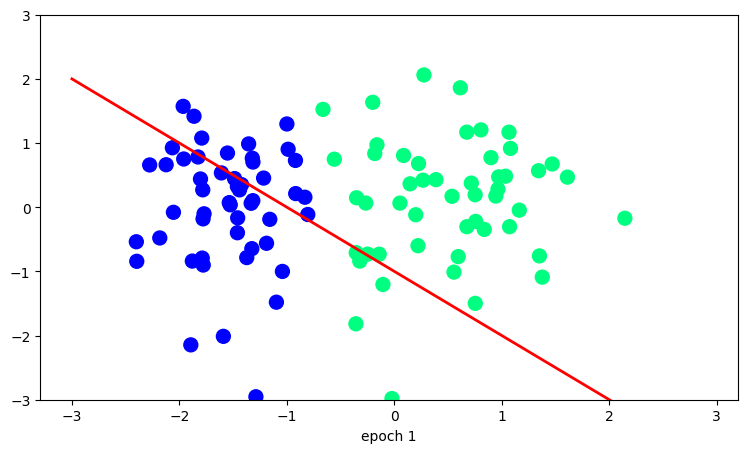

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(9,5))

X_i = np.arange(-3,3,0.1)
ax.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)
line, = ax.plot(X_i, X_i*m[0] + b[0], 'r-', linewidth=2)
plt.ylim(-3,3)

def update(i):
    label = f'epoch {i+1}'
    line.set_ydata(X_i*m[i] + b[i])
    ax.set_xlabel(label)
    return line,

# Keep a reference to prevent garbage collection
anim = FuncAnimation(fig, update, frames=200, interval=100, repeat=True)

# Show animation in Colab
display(HTML(anim.to_jshtml()))


In [ ]:
from matplotlib.animation import PillowWriter

In [ ]:
writer = PillowWriter(fps=10)
anim.save('perceptron_animation.gif', writer=writer)